In [1]:
!pip install -q tensorflow tensorflow-hub tf-keras pillow matplotlib

In [2]:
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

from PIL import Image
from google.colab import files

In [3]:
MODEL_URL = "https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1"

detector = hub.load(MODEL_URL)
print("Mask R-CNN model loaded successfully")

Mask R-CNN model loaded successfully


In [30]:
# Model information
print("Available signatures:", list(detector.signatures.keys()))
print("Model: Mask R-CNN Inception-ResNet-v2")
print("Loaded object type:", type(detector))

print("\nAvailable signatures:", list(detector.signatures.keys()))

if detector.signatures:
    first_key = list(detector.signatures.keys())[0]
    infer = detector.signatures[first_key]

    print("\nInput Signature:")
    print(infer.structured_input_signature)

    print("\nOutput Tensors:")
    for key, value in infer.structured_outputs.items():
        print(f"- {key}: shape={value.shape}, dtype={value.dtype}")
else:
    print("\nNo explicit signatures found. Inference is still done via detector(input_tensor).")

Available signatures: ['serving_default']
Model: Mask R-CNN Inception-ResNet-v2
Loaded object type: <class 'tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject'>

Available signatures: ['serving_default']

Input Signature:
((), {'input_tensor': TensorSpec(shape=(1, None, None, 3), dtype=tf.uint8, name='input_tensor')})

Output Tensors:
- anchors: shape=(None, 4), dtype=<dtype: 'float32'>
- box_classifier_features: shape=(300, 9, 9, 1536), dtype=<dtype: 'float32'>
- class_predictions_with_background: shape=(300, 91), dtype=<dtype: 'float32'>
- detection_anchor_indices: shape=(1, 100), dtype=<dtype: 'float32'>
- detection_boxes: shape=(1, 100, 4), dtype=<dtype: 'float32'>
- detection_classes: shape=(1, 100), dtype=<dtype: 'float32'>
- detection_masks: shape=(1, 100, 33, 33), dtype=<dtype: 'float32'>
- detection_multiclass_scores: shape=(1, 100, 91), dtype=<dtype: 'float32'>
- detection_scores: shape=(1, 100), dtype=<dtype: 'float32'>
- final_anchors:

In [4]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4417, done.
remote: Counting objects: 100% (4417/4417), done.
remote: Compressing objects: 100% (3282/3282), done.
remote: Total 4417 (delta 1193), reused 3007 (delta 1060), pack-reused 0 (from 0)
Receiving objects: 100% (4417/4417), 70.07 MiB | 29.38 MiB/s, done.
Resolving deltas: 100% (1193/1193), done.


In [6]:
from object_detection.utils import label_map_util
LABEL_MAP_PATH = "/content/models/research/object_detection/data/mscoco_label_map.pbtxt"

category_index = label_map_util.create_category_index_from_labelmap(
    LABEL_MAP_PATH,
    use_display_name=True
)

print("Loaded", len(category_index), "COCO classes")

Loaded 80 COCO classes


In [7]:
uploaded = files.upload()

image_paths = list(uploaded.keys())

print("Uploaded images:")
for path in image_paths:
    print(path)

Saving ball.jpg to ball.jpg
Saving chairs.jpg to chairs.jpg
Saving dog_bike_car.jpg to dog_bike_car.jpg
Saving person.jpg to person.jpg
Saving traffic.jpg to traffic.jpg
Uploaded images:
ball.jpg
chairs.jpg
dog_bike_car.jpg
person.jpg
traffic.jpg


In [21]:
def load_image(path):
    image = Image.open(path).convert("RGB")
    return np.array(image)

def run_inference(image_np):
    input_tensor = tf.convert_to_tensor(image_np, dtype=tf.uint8)
    input_tensor = tf.expand_dims(input_tensor, axis=0)
    outputs = detector(input_tensor)
    outputs = {k: v.numpy() for k, v in outputs.items()}
    return outputs

def box_to_pixels(box, height, width):
    ymin, xmin, ymax, xmax = box
    return (
        int(ymin * height),
        int(xmin * width),
        int(ymax * height),
        int(xmax * width)
    )

def resize_mask(mask, target_h, target_w):
    mask = tf.convert_to_tensor(mask, dtype=tf.float32)
    mask = tf.expand_dims(mask, axis=-1)
    mask = tf.image.resize(mask, [target_h, target_w], method="nearest")
    mask = tf.squeeze(mask, axis=-1)
    return mask.numpy()

def paste_mask_in_image(mask, box, image_shape, threshold=0.5):
    h, w = image_shape[:2]
    ymin, xmin, ymax, xmax = box_to_pixels(box, h, w)

    ymin = max(0, ymin)
    xmin = max(0, xmin)
    ymax = min(h, ymax)
    xmax = min(w, xmax)

    if ymax <= ymin or xmax <= xmin:
        return np.zeros((h, w), dtype=np.uint8)

    box_h = ymax - ymin
    box_w = xmax - xmin

    resized_mask = resize_mask(mask, box_h, box_w)
    binary_mask = (resized_mask > threshold).astype(np.uint8)

    full_mask = np.zeros((h, w), dtype=np.uint8)
    full_mask[ymin:ymax, xmin:xmax] = binary_mask
    return full_mask

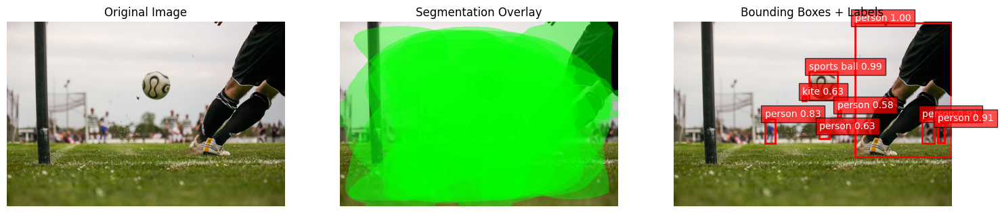

Input image shape: (426, 640, 3)
Detection boxes shape: (1, 100, 4)
Detection classes shape: (1, 100)
Detection scores shape: (1, 100)
Detection masks shape: (1, 100, 33, 33)


In [26]:
# Load one sample image
sample_image = load_image(image_paths[0])

# Run inference
sample_outputs = run_inference(sample_image)

boxes = sample_outputs["detection_boxes"][0]
classes = sample_outputs["detection_classes"][0].astype(np.int32)
scores = sample_outputs["detection_scores"][0]
masks = sample_outputs["detection_masks"][0]

h, w = sample_image.shape[:2]

# ---------- Image ----------
plt.figure(figsize=(18,6))

plt.subplot(1,3,1)
plt.imshow(sample_image)
plt.title("Original Image")
plt.axis("off")

# ---------- Segmentation Overlay ----------
overlay = sample_image.copy()

for i in range(len(scores)):

    if scores[i] < 0.5:
        continue

    mask = masks[i]

    mask = tf.image.resize(mask[...,None], (h,w))
    mask = tf.squeeze(mask).numpy()

    binary_mask = mask > 0.5

    overlay[binary_mask] = overlay[binary_mask]*0.6 + np.array([0,255,0])*0.4

plt.subplot(1,3,2)
plt.imshow(overlay.astype(np.uint8))
plt.title("Segmentation Overlay")
plt.axis("off")

# ---------- Bounding Boxes ----------
plt.subplot(1,3,3)
plt.imshow(sample_image)

for i in range(len(scores)):

    if scores[i] < 0.5:
        continue

    ymin, xmin, ymax, xmax = boxes[i]

    ymin = int(ymin*h)
    ymax = int(ymax*h)
    xmin = int(xmin*w)
    xmax = int(xmax*w)

    cls = classes[i]
    label = category_index.get(cls, {"name":"N/A"})["name"]
    score = scores[i]

    rect = plt.Rectangle(
        (xmin,ymin),
        xmax-xmin,
        ymax-ymin,
        fill=False,
        edgecolor="red",
        linewidth=2
    )

    plt.gca().add_patch(rect)

    plt.text(
        xmin,
        ymin-5,
        f"{label} {score:.2f}",
        color="white",
        fontsize=10,
        bbox=dict(facecolor="red", alpha=0.7)
    )

plt.title("Bounding Boxes + Labels")
plt.axis("off")

plt.show()

# ---------- Print shapes ----------
print("Input image shape:", sample_image.shape)
print("Detection boxes shape:", sample_outputs["detection_boxes"].shape)
print("Detection classes shape:", sample_outputs["detection_classes"].shape)
print("Detection scores shape:", sample_outputs["detection_scores"].shape)
print("Detection masks shape:", sample_outputs["detection_masks"].shape)

In [23]:
def print_detections(outputs, score_threshold=0.5):
    boxes = outputs["detection_boxes"][0]
    classes = outputs["detection_classes"][0].astype(np.int32)
    scores = outputs["detection_scores"][0]

    print(f"\nDetections at threshold = {score_threshold}")
    print("-" * 70)

    count = 0
    for i in range(len(scores)):
        if scores[i] >= score_threshold:
            count += 1
            cls = classes[i]
            label = category_index.get(cls, {"name": "N/A"})["name"]

            print(f"{count}. Class label: {label}")
            print(f"   Confidence score: {scores[i]:.3f}")
            print(f"   Bounding box: {boxes[i]}")

In [24]:
def visualize_predictions(image_np, outputs, score_threshold=0.5, mask_threshold=0.5):
    image_vis = image_np.copy().astype(np.float32)
    h, w = image_np.shape[:2]

    boxes = outputs["detection_boxes"][0]
    classes = outputs["detection_classes"][0].astype(np.int32)
    scores = outputs["detection_scores"][0]
    masks = outputs["detection_masks"][0]

    for i in range(len(scores)):
        if scores[i] < score_threshold:
            continue

        full_mask = paste_mask_in_image(
            masks[i], boxes[i], image_np.shape, threshold=mask_threshold
        )

        overlay = np.zeros_like(image_vis)
        overlay[:, :, 1] = full_mask * 255
        image_vis = np.where(overlay > 0, 0.6 * image_vis + 0.4 * overlay, image_vis)

    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(image_vis.astype(np.uint8))

    for i in range(len(scores)):
        if scores[i] < score_threshold:
            continue

        box = boxes[i]
        cls = classes[i]
        score = scores[i]
        label = category_index.get(cls, {"name": "N/A"})["name"]

        ymin, xmin, ymax, xmax = box_to_pixels(box, h, w)

        rect = plt.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            fill=False,
            edgecolor="red",
            linewidth=2
        )
        ax.add_patch(rect)

        ax.text(
            xmin,
            max(0, ymin - 5),
            f"{label}: {score:.2f}",
            color="white",
            fontsize=10,
            bbox=dict(facecolor="red", alpha=0.7, pad=2)
        )

    ax.axis("off")
    plt.show()

Image 1: ball.jpg
Input image shape: (426, 640, 3)
Detection boxes shape: (1, 100, 4)
Detection classes shape: (1, 100)
Detection scores shape: (1, 100)
Detection masks shape: (1, 100, 33, 33)


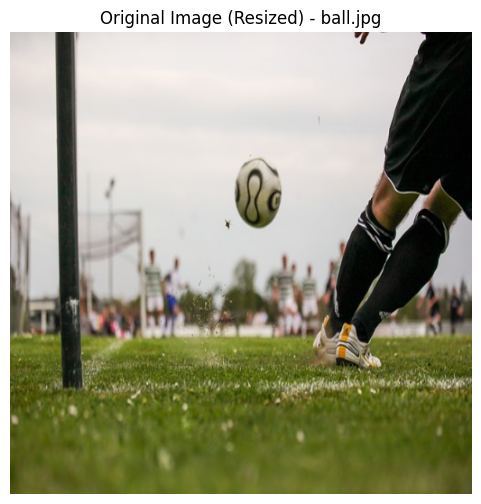


Detections with threshold = 0.5

Detections at threshold = 0.5
----------------------------------------------------------------------
1. Class label: person
   Confidence score: 0.998
   Bounding box: [0.00622508 0.65331477 0.7341037  1.        ]
2. Class label: sports ball
   Confidence score: 0.989
   Bounding box: [0.2713722  0.48837936 0.42260933 0.59114647]
3. Class label: person
   Confidence score: 0.913
   Bounding box: [0.52758014 0.89600027 0.6594602  0.9378979 ]
4. Class label: person
   Confidence score: 0.910
   Bounding box: [0.55070037 0.9513907  0.6566176  0.9764144 ]
5. Class label: person
   Confidence score: 0.829
   Bounding box: [0.52660793 0.32940915 0.6608793  0.36676475]
6. Class label: person
   Confidence score: 0.633
   Bounding box: [0.5924172 0.5253284 0.6346335 0.5605377]
7. Class label: kite
   Confidence score: 0.633
   Bounding box: [0.40377808 0.46458793 0.42832565 0.47908038]
8. Class label: person
   Confidence score: 0.580
   Bounding box: [0.47949

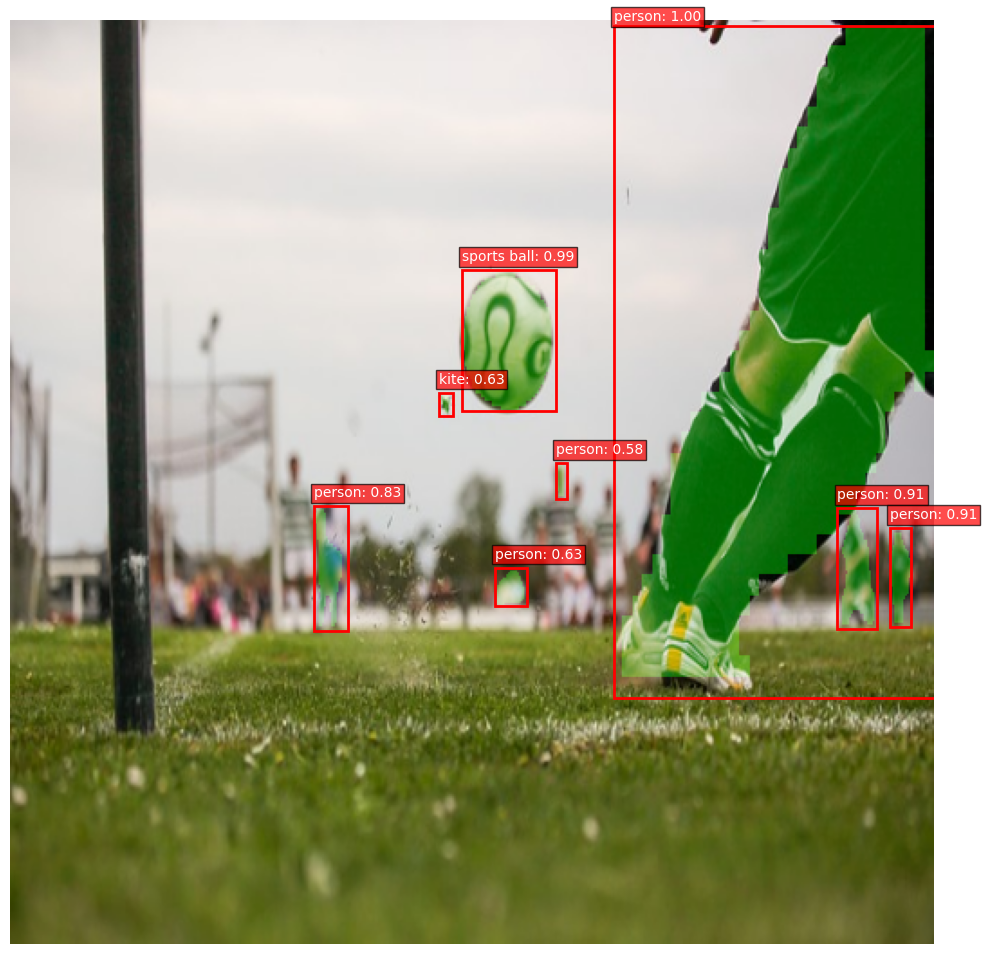


Detections with threshold = 0.3

Detections at threshold = 0.3
----------------------------------------------------------------------
1. Class label: person
   Confidence score: 0.998
   Bounding box: [0.00622508 0.65331477 0.7341037  1.        ]
2. Class label: sports ball
   Confidence score: 0.989
   Bounding box: [0.2713722  0.48837936 0.42260933 0.59114647]
3. Class label: person
   Confidence score: 0.913
   Bounding box: [0.52758014 0.89600027 0.6594602  0.9378979 ]
4. Class label: person
   Confidence score: 0.910
   Bounding box: [0.55070037 0.9513907  0.6566176  0.9764144 ]
5. Class label: person
   Confidence score: 0.829
   Bounding box: [0.52660793 0.32940915 0.6608793  0.36676475]
6. Class label: person
   Confidence score: 0.633
   Bounding box: [0.5924172 0.5253284 0.6346335 0.5605377]
7. Class label: kite
   Confidence score: 0.633
   Bounding box: [0.40377808 0.46458793 0.42832565 0.47908038]
8. Class label: person
   Confidence score: 0.580
   Bounding box: [0.47949

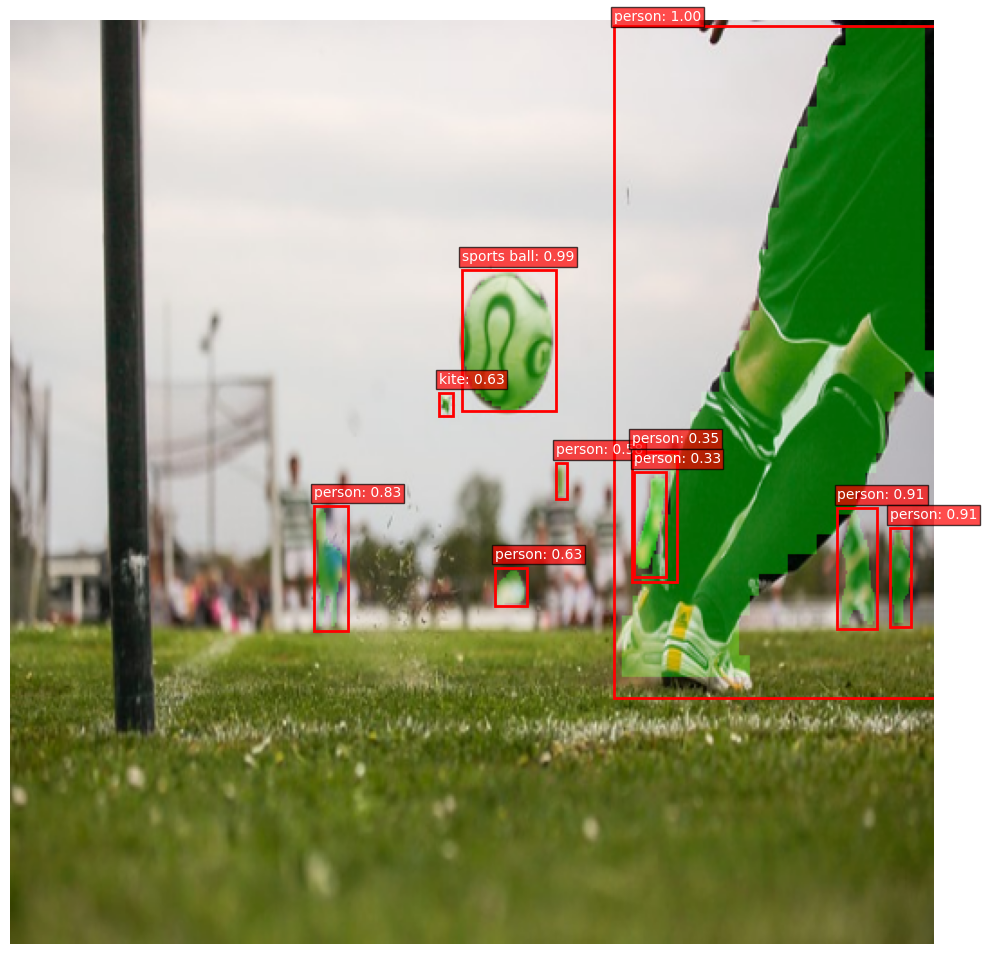

Image 2: chairs.jpg
Input image shape: (480, 640, 3)
Detection boxes shape: (1, 100, 4)
Detection classes shape: (1, 100)
Detection scores shape: (1, 100)
Detection masks shape: (1, 100, 33, 33)


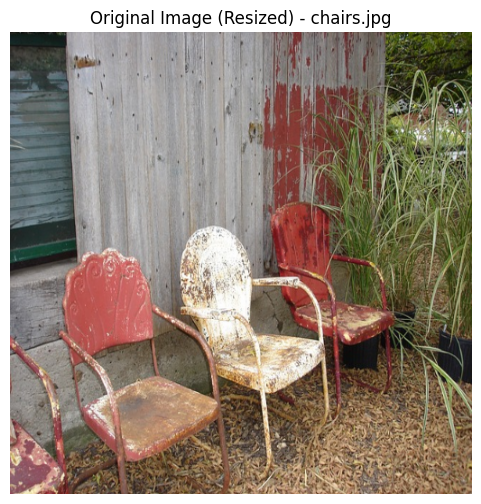


Detections with threshold = 0.5

Detections at threshold = 0.5
----------------------------------------------------------------------
1. Class label: chair
   Confidence score: 0.989
   Bounding box: [0.46456563 0.11521289 1.         0.48869708]
2. Class label: chair
   Confidence score: 0.973
   Bounding box: [0.35100722 0.5673783  0.8436798  0.8382609 ]
3. Class label: chair
   Confidence score: 0.932
   Bounding box: [0.4143617  0.3649981  0.98126686 0.70612717]


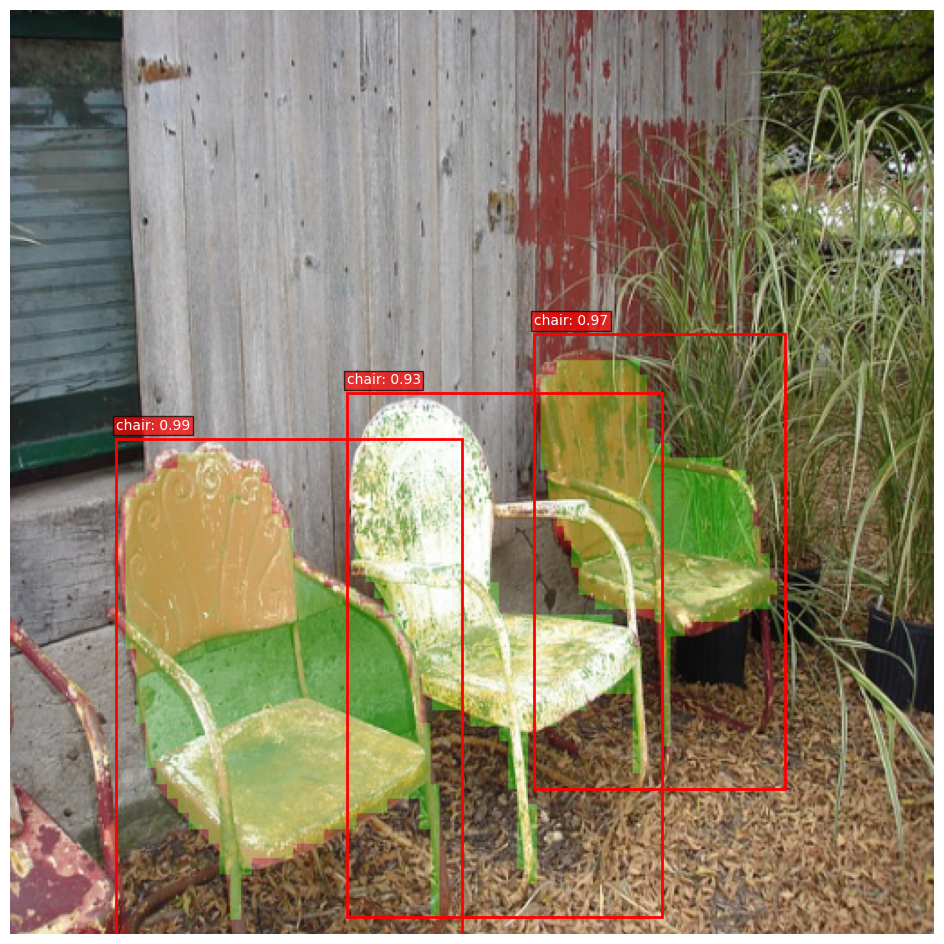


Detections with threshold = 0.3

Detections at threshold = 0.3
----------------------------------------------------------------------
1. Class label: chair
   Confidence score: 0.989
   Bounding box: [0.46456563 0.11521289 1.         0.48869708]
2. Class label: chair
   Confidence score: 0.973
   Bounding box: [0.35100722 0.5673783  0.8436798  0.8382609 ]
3. Class label: chair
   Confidence score: 0.932
   Bounding box: [0.4143617  0.3649981  0.98126686 0.70612717]
4. Class label: chair
   Confidence score: 0.346
   Bounding box: [0.44498262 0.26844603 0.98172355 0.5979976 ]
5. Class label: potted plant
   Confidence score: 0.316
   Bounding box: [0.16988191 0.71237636 0.8357619  0.9979247 ]


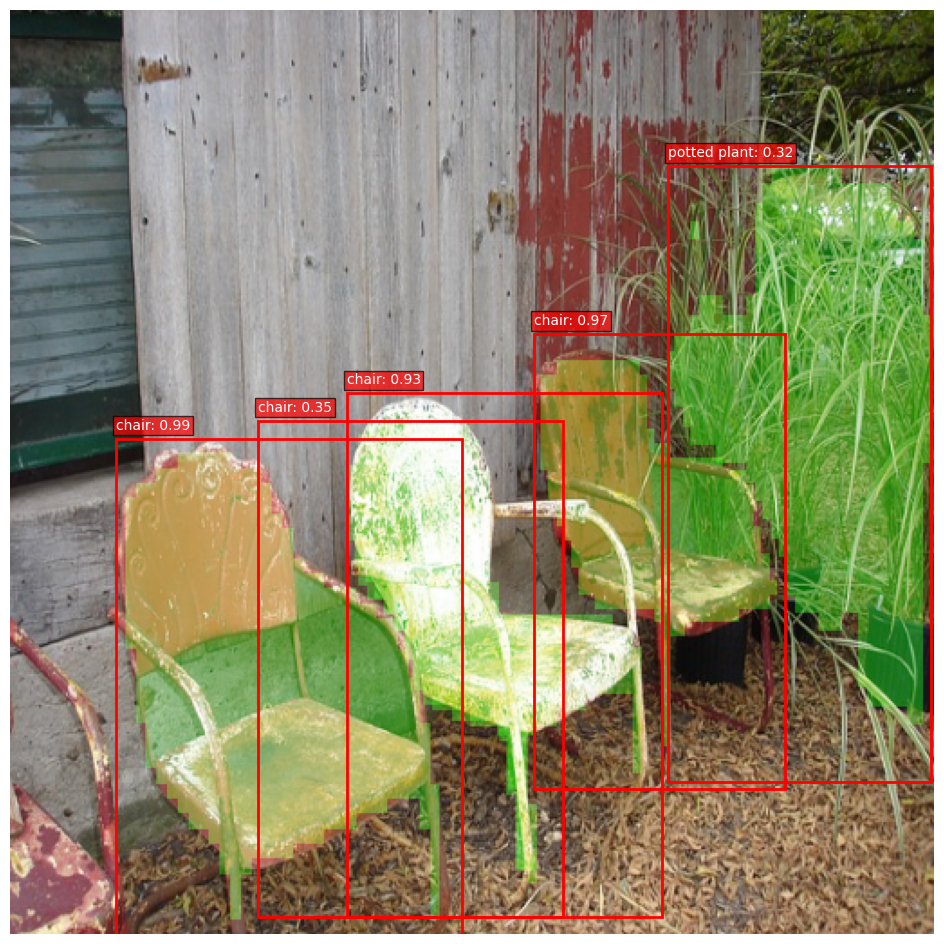

Image 3: dog_bike_car.jpg
Input image shape: (576, 768, 3)
Detection boxes shape: (1, 100, 4)
Detection classes shape: (1, 100)
Detection scores shape: (1, 100)
Detection masks shape: (1, 100, 33, 33)


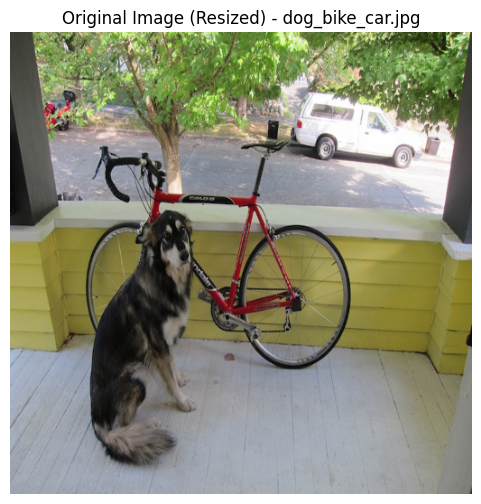


Detections with threshold = 0.5

Detections at threshold = 0.5
----------------------------------------------------------------------
1. Class label: bicycle
   Confidence score: 0.999
   Bounding box: [0.19065115 0.16893917 0.74866617 0.72393   ]
2. Class label: dog
   Confidence score: 0.970
   Bounding box: [0.39487657 0.17878956 0.93661547 0.40838194]
3. Class label: truck
   Confidence score: 0.672
   Bounding box: [0.1300767  0.6079715  0.29441798 0.89157873]
4. Class label: potted plant
   Confidence score: 0.579
   Bounding box: [0.19085962 0.89664364 0.26532337 0.9311162 ]
5. Class label: cat
   Confidence score: 0.562
   Bounding box: [0.40699953 0.17169952 0.9335262  0.41256177]


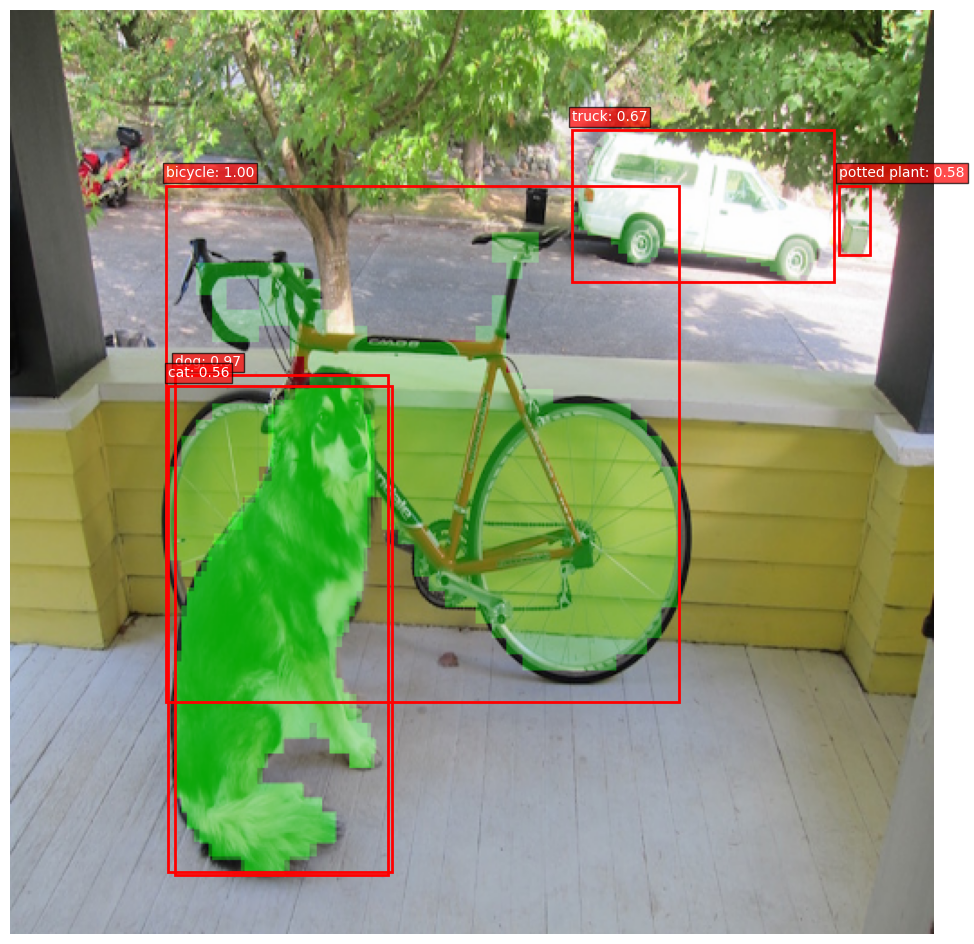


Detections with threshold = 0.3

Detections at threshold = 0.3
----------------------------------------------------------------------
1. Class label: bicycle
   Confidence score: 0.999
   Bounding box: [0.19065115 0.16893917 0.74866617 0.72393   ]
2. Class label: dog
   Confidence score: 0.970
   Bounding box: [0.39487657 0.17878956 0.93661547 0.40838194]
3. Class label: truck
   Confidence score: 0.672
   Bounding box: [0.1300767  0.6079715  0.29441798 0.89157873]
4. Class label: potted plant
   Confidence score: 0.579
   Bounding box: [0.19085962 0.89664364 0.26532337 0.9311162 ]
5. Class label: cat
   Confidence score: 0.562
   Bounding box: [0.40699953 0.17169952 0.9335262  0.41256177]
6. Class label: car
   Confidence score: 0.495
   Bounding box: [0.13358289 0.60528433 0.29999983 0.8879628 ]


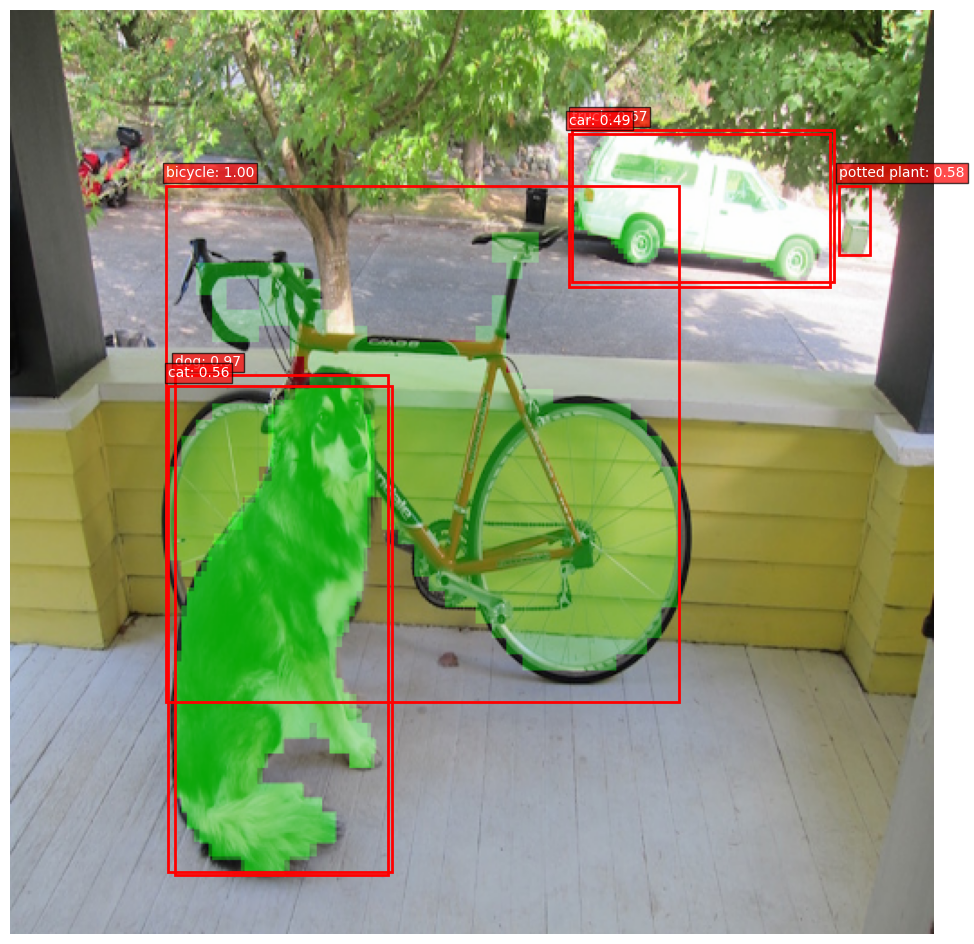

Image 4: person.jpg
Input image shape: (683, 1024, 3)
Detection boxes shape: (1, 100, 4)
Detection classes shape: (1, 100)
Detection scores shape: (1, 100)
Detection masks shape: (1, 100, 33, 33)


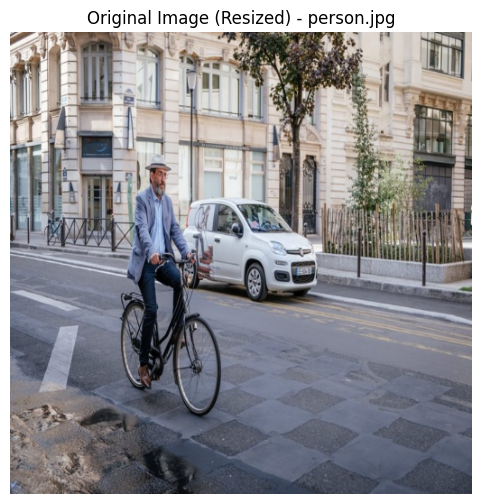


Detections with threshold = 0.5

Detections at threshold = 0.5
----------------------------------------------------------------------
1. Class label: person
   Confidence score: 0.999
   Bounding box: [0.26230857 0.25477713 0.7693695  0.40050006]
2. Class label: bicycle
   Confidence score: 0.997
   Bounding box: [0.4921208  0.23417366 0.8258645  0.45998305]
3. Class label: car
   Confidence score: 0.995
   Bounding box: [0.353896   0.36331218 0.583097   0.6667064 ]
4. Class label: bicycle
   Confidence score: 0.895
   Bounding box: [0.38831532 0.07297656 0.4584034  0.11992848]


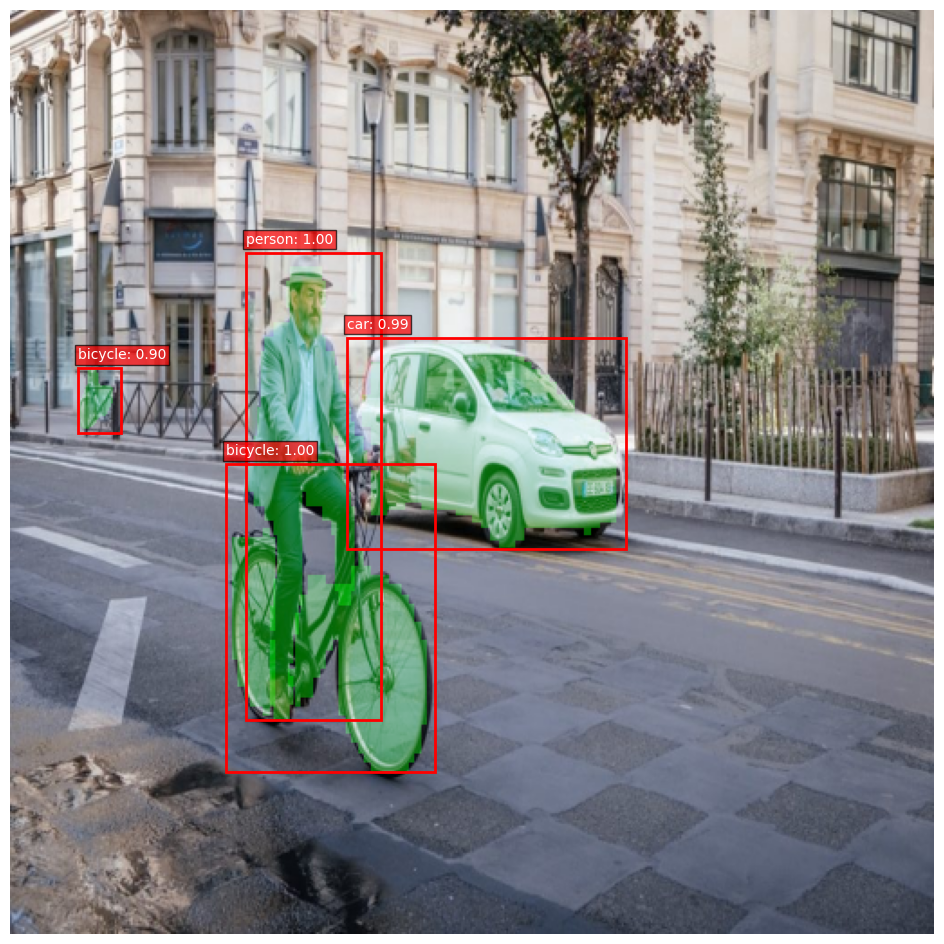


Detections with threshold = 0.3

Detections at threshold = 0.3
----------------------------------------------------------------------
1. Class label: person
   Confidence score: 0.999
   Bounding box: [0.26230857 0.25477713 0.7693695  0.40050006]
2. Class label: bicycle
   Confidence score: 0.997
   Bounding box: [0.4921208  0.23417366 0.8258645  0.45998305]
3. Class label: car
   Confidence score: 0.995
   Bounding box: [0.353896   0.36331218 0.583097   0.6667064 ]
4. Class label: bicycle
   Confidence score: 0.895
   Bounding box: [0.38831532 0.07297656 0.4584034  0.11992848]


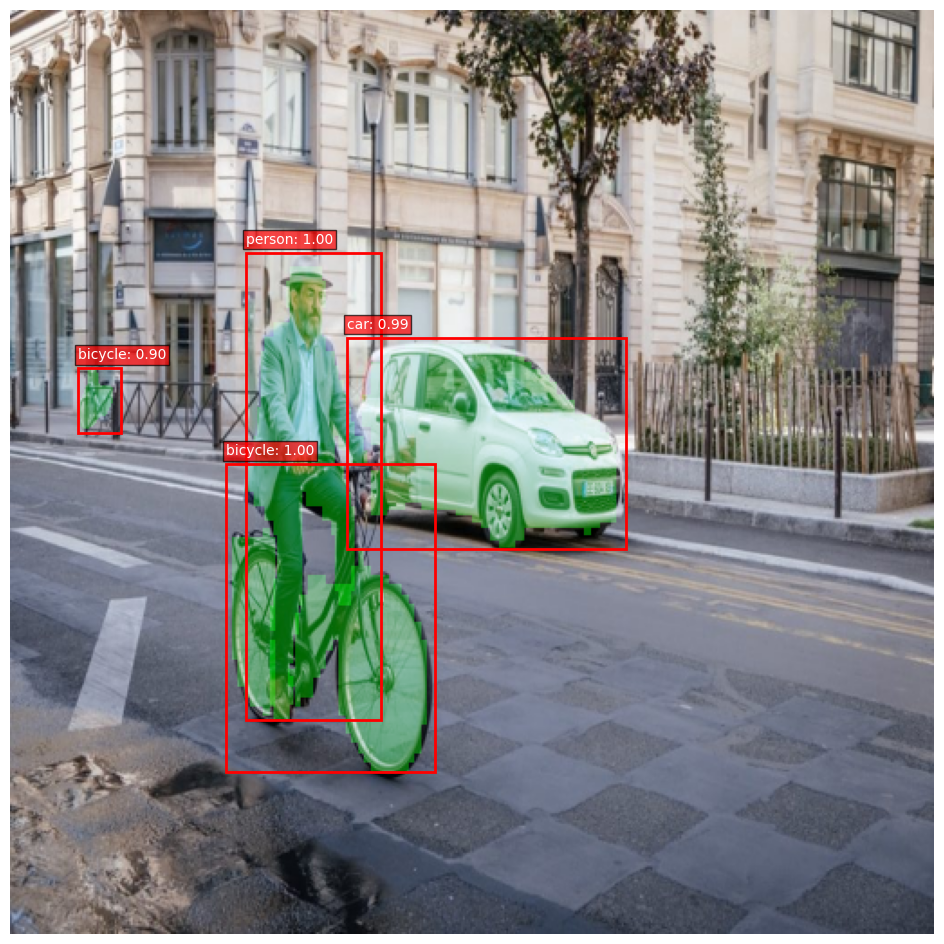

Image 5: traffic.jpg
Input image shape: (720, 1280, 3)
Detection boxes shape: (1, 100, 4)
Detection classes shape: (1, 100)
Detection scores shape: (1, 100)
Detection masks shape: (1, 100, 33, 33)


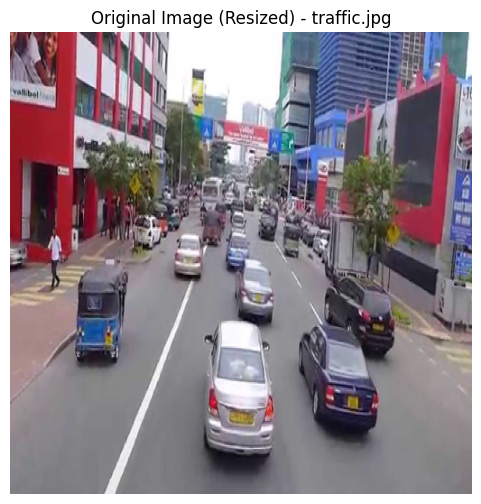


Detections with threshold = 0.5

Detections at threshold = 0.5
----------------------------------------------------------------------
1. Class label: car
   Confidence score: 0.997
   Bounding box: [0.6241019  0.41910487 0.9100423  0.5764688 ]
2. Class label: car
   Confidence score: 0.996
   Bounding box: [0.6231178  0.6217955  0.86865425 0.79982525]
3. Class label: person
   Confidence score: 0.995
   Bounding box: [0.4233662  0.08106521 0.5589706  0.11362667]
4. Class label: car
   Confidence score: 0.984
   Bounding box: [0.4349584  0.35351518 0.533178   0.41958722]
5. Class label: car
   Confidence score: 0.982
   Bounding box: [0.49248147 0.48886192 0.6370231  0.5762061 ]
6. Class label: car
   Confidence score: 0.962
   Bounding box: [0.39656636 0.26755577 0.46852812 0.3293388 ]
7. Class label: car
   Confidence score: 0.888
   Bounding box: [0.43178222 0.6540449  0.48265806 0.69073814]
8. Class label: car
   Confidence score: 0.851
   Bounding box: [0.43582782 0.46435598 0.515

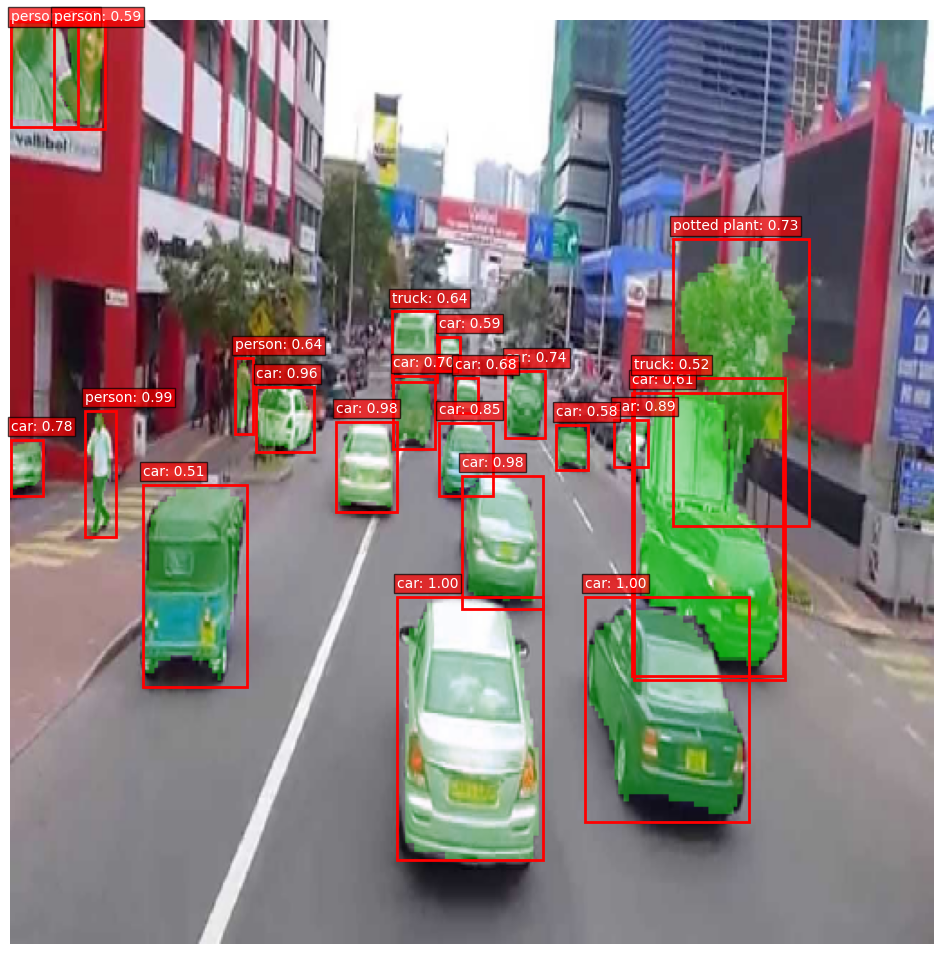


Detections with threshold = 0.3

Detections at threshold = 0.3
----------------------------------------------------------------------
1. Class label: car
   Confidence score: 0.997
   Bounding box: [0.6241019  0.41910487 0.9100423  0.5764688 ]
2. Class label: car
   Confidence score: 0.996
   Bounding box: [0.6231178  0.6217955  0.86865425 0.79982525]
3. Class label: person
   Confidence score: 0.995
   Bounding box: [0.4233662  0.08106521 0.5589706  0.11362667]
4. Class label: car
   Confidence score: 0.984
   Bounding box: [0.4349584  0.35351518 0.533178   0.41958722]
5. Class label: car
   Confidence score: 0.982
   Bounding box: [0.49248147 0.48886192 0.6370231  0.5762061 ]
6. Class label: car
   Confidence score: 0.962
   Bounding box: [0.39656636 0.26755577 0.46852812 0.3293388 ]
7. Class label: car
   Confidence score: 0.888
   Bounding box: [0.43178222 0.6540449  0.48265806 0.69073814]
8. Class label: car
   Confidence score: 0.851
   Bounding box: [0.43582782 0.46435598 0.515

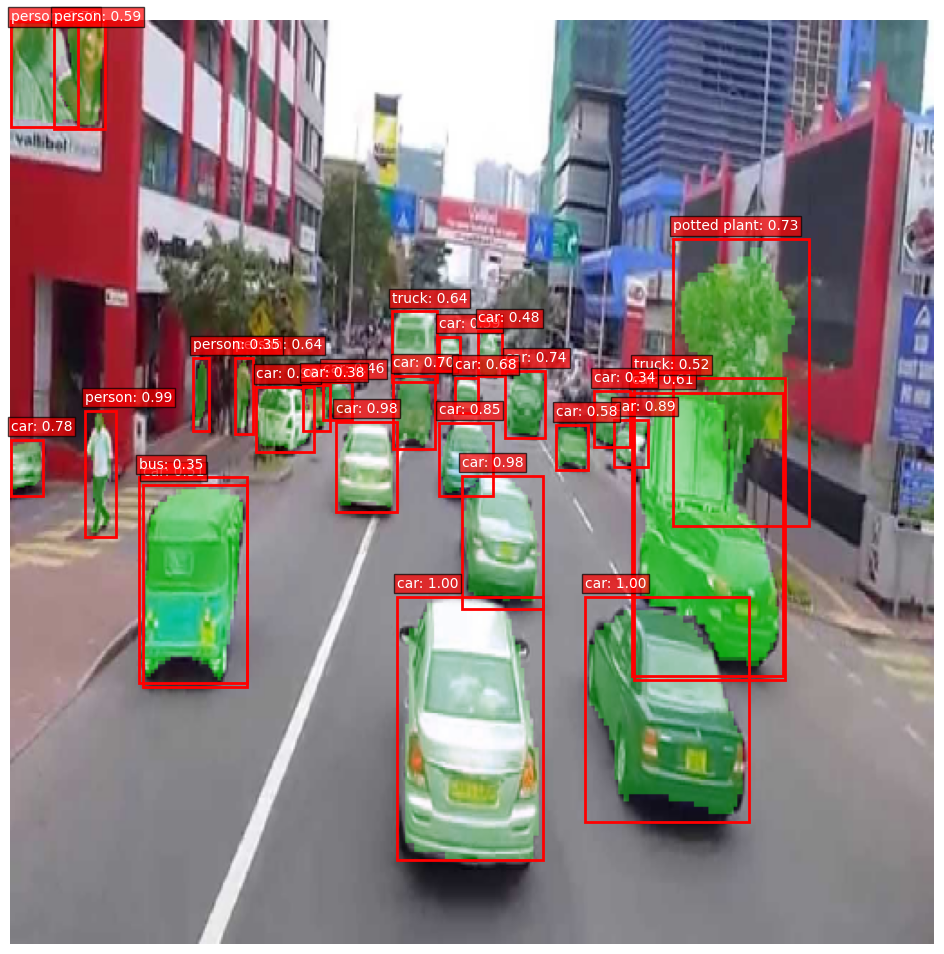

In [28]:
VIS_SIZE = (512, 512)   # visualization size

all_results = []

for idx, path in enumerate(image_paths, start=1):
    print("=" * 100)
    print(f"Image {idx}: {path}")

    image_np = load_image(path)
    outputs = run_inference(image_np)

    all_results.append((path, image_np, outputs))

    print("Input image shape:", image_np.shape)
    print("Detection boxes shape:", outputs["detection_boxes"].shape)
    print("Detection classes shape:", outputs["detection_classes"].shape)
    print("Detection scores shape:", outputs["detection_scores"].shape)
    print("Detection masks shape:", outputs["detection_masks"].shape)

    # Resize image for display
    vis_image = tf.image.resize(image_np, VIS_SIZE).numpy().astype(np.uint8)

    plt.figure(figsize=(6,6))
    plt.imshow(vis_image)
    plt.title(f"Original Image (Resized) - {path}")
    plt.axis("off")
    plt.show()

    print("\nDetections with threshold = 0.5")
    print_detections(outputs, score_threshold=0.5)
    visualize_predictions(vis_image, outputs, score_threshold=0.5, mask_threshold=0.5)

    print("\nDetections with threshold = 0.3")
    print_detections(outputs, score_threshold=0.3)
    visualize_predictions(vis_image, outputs, score_threshold=0.3, mask_threshold=0.5)

In [33]:
import pandas as pd

summary_rows = []

for path, image_np, outputs in all_results:
    scores = outputs["detection_scores"][0]

    det_05 = int(np.sum(scores >= 0.5))
    det_03 = int(np.sum(scores >= 0.3))



    summary_rows.append({
        "Image Name": path,
        "Detections at 0.5": det_05,
        "Detections at 0.3": det_03,

    })

summary_df = pd.DataFrame(summary_rows)
summary_df

,Image Name,Detections at 0.5,Detections at 0.3
0,ball.jpg,8,10
1,chairs.jpg,3,5
2,dog_bike_car.jpg,5,6
3,person.jpg,4,4
4,traffic.jpg,22,28
